# UK Regional Capacity Model

The model takes weather and land use data and predicts the percentage of solar PV capacity in a region. 

## Import libraries and data 

In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import dataframe_image as dfi
import statsmodels.api as sm
import seaborn as sns
from statsmodels.stats.diagnostic import normal_ad
from sklearn.linear_model import LinearRegression
import warnings
from sklearn import linear_model
from scipy import stats
import statsmodels
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.compat import lzip
## Data Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_percentage_error
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import StratifiedKFold
from matplotlib import rc
# import pandas_profiling
from sklearn.datasets import make_regression
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from numpy import absolute
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from xgboost import XGBRegressor
import xgboost as xgb
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import geopandas
import joblib
import pycountry
from pathlib import Path
from sklearn.model_selection import GridSearchCV
from model_training_norm import select_columns_by_column_name, split_data_by_year, split_data_by_year_and_country, drop_columns_with_high_nan, select_columns_by_correlation, scale_capacity_to_national, convert_from_percentage_to_MW, calculate_predicted_national_capacity, gb_results, gb_scaled_results, plot_actual_vs_predicted_regional_capacity, plot_actual_vs_predicted_national_capacity, plot_set, split_data_by_country  
from model_training_norm import select_columns_by_average_correlation, training_results, training_scaled_results, generate_predictions_training_data, apply_model_to_all_countries, select_columns_by_spearman_correlation, train_xgboost_model, calculate_mape_by_country
# from utilities import save_data
import mlflow
from mlflow import MlflowClient
from sklearn.model_selection import GroupKFold

plt.style.use('ggplot')
sns.set_palette('colorblind')

In [2]:
config = {
  'toImageButtonOptions': {
    'format': 'jpeg', # one of png, svg, jpeg, webp
    'filename': 'custom_image',
    # 'height': 1000,
    # 'width': 1000,
    'scale': 2 # Multiply title/legend/axis/canvas sizes by this factor
  }
}

## Create an mlflow experiment 

In [3]:

os.environ["MLFLOW_TRACKING_URI"] = "http://host.docker.internal:5001"


In [4]:
# # Create an experiment name, which must be unique and case sensitive
# experiment_id = mlflow.create_experiment(
#     "gb_pv_capacity_norm",
#     artifact_location=Path.cwd().joinpath("mlruns").as_uri(),
#     # tags={"version": "v1"},
# )
# experiment = mlflow.get_experiment(experiment_id)
# print(f"Name: {experiment.name}")
# print(f"Experiment_id: {experiment.experiment_id}")
# print(f"Artifact Location: {experiment.artifact_location}")
# print(f"Tags: {experiment.tags}")
# print(f"Lifecycle_stage: {experiment.lifecycle_stage}")
# print(f"Creation timestamp: {experiment.creation_time}")


## Train the model

### Model Training and Evaluation 

This script is designed to train an XGBoost model using a custom dataset, with the flexibility to choose between different cross-validation strategies. The results, including model parameters and predictions, are logged using MLflow for tracking and reproducibility.

#### Key Steps:

1. **Define Parameters and Load Data**:
   - **experiment_id**: The ID of the MLflow experiment where this run will be logged.
   - **missing_data_threshold**: The percentage threshold above which columns with missing data will be dropped.
   - **correlation_threshold**: The threshold for selecting features based on their correlation with the target variable. The options available are either Pearsons correlation, Spearmans correlation, or the average of both. 
   - **test_size**: The proportion of the dataset to be used for testing. There are cases when this is not needed such as when splitting the data by year.
   - **model_name**: A name for saving the trained model.
   - **Load Dataset**: The dataset is loaded from a CSV file.       
  
2. **Start MLflow Run**:
   - An MLflow run is started, which allows all subsequent operations to be tracked and logged.
   - **Set Tags and Autologging**: Tags can be set to categorize the run, and `mlflow.autolog()` is enabled for automatic logging.

3. **Data Preprocessing**:
   - **Categorical Columns**: Columns like `country_cd`, `nuts_cd`, and `year` are converted to categorical data types.
   - **Training Data Selection**: Only rows where the `regional_capacity_percentage` column is not missing are selected for training. 
   - **Drop Columns with High Missing Data**: Columns with more than the specified threshold of missing data are removed.
   - **Feature Selection**: Features are selected based on their correlation with the target variable using a specified correlation threshold. The functions `select_columns_by_correlation`, `select_columns_by_spearman_correlation`, or `select_columns_by_average_correlation` can be used.

4. **Data Splitting**: The dataset is divided into training and testing sets using one of two methods:

   - **By Year**: The `split_data_by_year` function groups the data by year, then splits the dataset based on the specified `test_size` or based on manually selecting `test_years`. 

5. **Model Training**:

   - **Train the Model**:
     - The model is trained using the `train_xgboost_model` function.
     - If the data was split using `split_data_by_year`, the model will be trained with GroupKFold cross-validation (`use_group_kfold=True`).
     - The training process includes tuning the hyperparameters of the model using GridSearchCV. It exhaustively searches a predefined hyperparameter space to find the optimal combination of parameters that gives the best model performance. It does this by dividing the data into training and validation sets, and evaluating the model performance for each combination of hyperparameters on the validation set. The evaluation metric used is rmse and we use 10 cv folds or groupkfold.

   - **Save the Model**:
     - After training, the model is saved as a `.pkl` file.


6. **Prediction and Evaluation**:

   - **Generate Predictions for Training and Test Data**:
     - The `generate_predictions_training_data` function is used to generate predictions for both the training and test datasets.
     - The function adds predictions to the training and test datasets, and then combines these datasets.
     - The combined data includes additional columns for predicted values and is processed to convert percentage values to absolute values in megawatts (MW).


   - **Apply Model to All Countries**:
     - The `apply_model_to_all_countries` function applies the trained model to the entire dataset.
     - This function processes the data, makes predictions, and calculates residuals (differences between actual and predicted values).
     - It also performs data scaling and converts percentages to MW, while adding country names based on ISO codes.
     - This function is applied to a dataset that includes all regions, ensuring proper scaling is performed. Using a dataset with missing regions could lead to incorrect results due to incomplete scaling.


   - **Evaluate Model Performance**:
     - Use the predictions generated by the `generate_predictions_training_data` function to assess the model's performance on both the training and test datasets. This evaluation focuses on the accuracy of the regional capacity predictions before scaling. The performance is measured using metrics such as R², MSE, MAE, and RMSE. 
     - Use the predictions generated by the `apply_model_to_all_countries` function to evaluate the model's performance on scaled regional capacity predictions and on national capacity predictions.
     - The evaluation involves comparing the sum of regional capacity predictions to the actual national capacity. The performance is measured using metrics such as R², MSE, MAE, RMSE, and MAPE.
     - The functions `training_results`, `training_scaled_results` evaluate the regoinal predictions while `gb_results`, and `gb_scaled_results` evaluate the national predictions. 


   - **Save Results and Data**:
     - Save the processed data and results to CSV files.
     - Log these files to MLflow for tracking and further analysis.



In [5]:
experiment_id = '3'
# Define variables
missing_data_threshold = 10
correlation_threshold = 0.5
test_size = 0.2
model_name = "gbnormb105"

# import dataset
df = pd.read_csv('/gb_pv_capacity_model/data/20241127/processed/merged_nuts3_data_percentage.csv')

In [6]:
# Start a new run in the experiment
with mlflow.start_run(experiment_id=experiment_id) as run:
    mlflow.autolog()

    # set categorical columns
    df['country_cd'] = df.country_cd.astype('category')
    df['nuts_cd'] = df['nuts_cd'].astype('category')
    df['year'] = df.year.astype('category')

    # select training data set which is rows where regional capacity data is available 
    training_df= df[df['regional_capacity_percentage'].notna()]
    training_df

    # drop columns where missing data exceeds x percent
    training_df = drop_columns_with_high_nan(training_df, missing_data_threshold)
    training_df

    # select variables to include in the model by a correlation threshold
    selected_columns, column_labels =select_columns_by_average_correlation(training_df, 'regional_capacity_percentage', threshold=correlation_threshold, include_categorical=True)
    
    # split to training and test data 
    # x_train, x_test, y_train, y_test, train_data, test_data = split_data_by_year_and_country(selected_columns, test_size=test_size, random_state=42)
    x_train, x_test, y_train, y_test, train_data, test_data = split_data_by_year(selected_columns, target_column='regional_capacity_percentage', test_years=[2021, 2022, 2023], random_seed=42)
    # x_train, x_test, y_train, y_test, train_data, test_data = split_data_by_country(selected_columns, target_column='regional_capacity_percentage', test_country='BE', random_seed=42)

    
    # Log parameters into MLflow
    mlflow.log_param("missing_data_threshold", missing_data_threshold)
    mlflow.log_param("correlation_threshold", correlation_threshold)
    mlflow.log_param("test_size", test_size)

    # train the model 
    # if split by year and region, or region then use_group_kfold=False:
    # best_regressor, cv_results = train_xgboost_model(x_train, y_train, train_data, model_name=model_name, use_group_kfold=False)
    # if split by year then use_group_kfold=True:
    best_regressor, cv_results = train_xgboost_model(x_train, y_train, train_data, model_name=model_name, use_group_kfold=True)


    y_test_pred, y_train_pred, regional_data = generate_predictions_training_data(best_regressor, x_train, x_test, train_data, test_data, training_df)

    training_results(y_train, y_test, y_test_pred, y_train_pred, log_to_mlflow=True)
 

    gb_data = apply_model_to_all_countries(best_regressor, df, column_labels, regional_data)

    training_scaled_results(gb_data, log_to_mlflow=True)

    # before scaling
    gb_results(gb_data, log_to_mlflow=True, metric_label="gb")
    # after scaling
    gb_scaled_results(gb_data, log_to_mlflow=True, metric_label="gb_scaled")

    # save datasets
    ## Write csv from dataframe
    regional_data.to_csv('regional_data.csv', index=False)
    gb_data.to_csv('gb_data.csv', index=False)

    ## Log CSV to MLflow
    mlflow.log_artifact('regional_data.csv')
    mlflow.log_artifact('gb_data.csv')

    mlflow.end_run()
    

2024/12/24 17:15:00 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2024/12/24 17:15:00 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2024/12/24 17:15:00 INFO mlflow.tracking.fluent: Autologging successfully enabled for xgboost.
/gb_pv_capacity_model/models/model_training_norm.py:269: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  train_data = pd.concat([train_data, year_data])
/gb_pv_capacity_model/models/model_training_norm.py:269: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relev

Fold 1
Training data shape: (1680, 9)
Validation data shape: (168, 9)
Unique training groups: [2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019]
Categories (14, int64): [2010, 2011, 2012, 2013, ..., 2020, 2021, 2022, 2023]
Unique validation groups: [2020]
Categories (14, int64): [2010, 2011, 2012, 2013, ..., 2020, 2021, 2022, 2023]
----------------------------------------
Fold 2
Training data shape: (1680, 9)
Validation data shape: (168, 9)
Unique training groups: [2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2020]
Categories (14, int64): [2010, 2011, 2012, 2013, ..., 2020, 2021, 2022, 2023]
Unique validation groups: [2019]
Categories (14, int64): [2010, 2011, 2012, 2013, ..., 2020, 2021, 2022, 2023]
----------------------------------------
Fold 3
Training data shape: (1680, 9)
Validation data shape: (168, 9)
Unique training groups: [2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2019, 2020]
Categories (14, int64): [2010, 2011, 2012, 2013, ..., 2020, 2021, 2022, 202

2024/12/24 17:30:34 INFO mlflow.sklearn.utils: Logging the 5 best runs, 523 runs will be omitted.


🏃 View run glamorous-dove-205 at: http://host.docker.internal:5001/#/experiments/3/runs/41181599e71e407186a0a5b3ade4023e
🧪 View experiment at: http://host.docker.internal:5001/#/experiments/3
🏃 View run nimble-ant-836 at: http://host.docker.internal:5001/#/experiments/3/runs/6c002f572e1c4244a936c67b562ee386
🧪 View experiment at: http://host.docker.internal:5001/#/experiments/3
🏃 View run able-stag-583 at: http://host.docker.internal:5001/#/experiments/3/runs/a509748a7cc845a29e7aa487f47e9f0c
🧪 View experiment at: http://host.docker.internal:5001/#/experiments/3
🏃 View run able-shrike-413 at: http://host.docker.internal:5001/#/experiments/3/runs/a053e6a5f8c94827af2a1e011263f4d4
🧪 View experiment at: http://host.docker.internal:5001/#/experiments/3


2024/12/24 17:30:35 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: The following failures occurred while performing one or more logging operations: [MlflowException('Failed to perform one or more operations on the run with ID c1b4062d6002438498388078bd334ec3. Failed operations: [RestException("INVALID_PARAMETER_VALUE: Param value \'XGBRegressor(base_score=None, booster=None, callbacks=None,\\n             colsample_bylevel=None, colsample_bynode=None,\\n             colsample_bytree=None, early_stopping_rounds=None,\\n             enable_categorical=False, eval_metric=\'rmse\', gamma=N\' had length 731, which exceeded length limit of 500")]')]


🏃 View run gentle-roo-925 at: http://host.docker.internal:5001/#/experiments/3/runs/94b9b6c713844bbb88a85cadffb8005d
🧪 View experiment at: http://host.docker.internal:5001/#/experiments/3
 Results from Grid Search 

 The best estimator across ALL searched params:
 XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric='rmse', gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.01, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=500, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

 The best score across ALL searched params:
 0.866

2024/12/24 17:30:37 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


R2 training score is  0.9431885085333714
R2 test score is  0.917980539356577
The MSE is: 0.05693127655669007
The MAE is: 0.14111980434203236
RMSE is: 0.238602758904188
MAPE is: 53432891669488.09
R2 test score is  0.9373336776955131
The MSE is: 0.045819410337657386
The MAE is: 0.13173304075492048
RMSE is: 0.21405469006227681
MAPE is: 50385710321803.67
R2 test score is  0.9199286804552815
The MSE is: 0.055579034554709854
The MAE is: 0.14168191021157742
RMSE is: 0.23575206161285175
MAPE is: 54673445170355.16
R2 test score is  0.9932784137695417
The MSE is: 208578.49821842057
The MAE is: 383.20075785493924
RMSE is: 456.70395029868155
MAPE is: 0.04842425595415989
R2 test score is  0.9999999999999963
The MSE is: 1.1419747964473155e-07
The MAE is: 0.0002477120534284235
RMSE is: 0.0003379311758993709
MAPE is: 3.1430058036660145e-08
🏃 View run defiant-shrike-108 at: http://host.docker.internal:5001/#/experiments/3/runs/c1b4062d6002438498388078bd334ec3
🧪 View experiment at: http://host.docker.in

In [6]:
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_learning_rate,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,9.401151,0.454058,0.039709,0.029660,0.01,3,500,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.887155,0.908614,...,0.941271,0.953403,0.945875,0.890099,0.935544,0.917550,0.927237,0.923439,0.021402,390
1,11.395388,0.654585,0.038756,0.011713,0.01,3,600,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.891854,0.909127,...,0.953240,0.958688,0.956216,0.896739,0.942707,0.919595,0.939296,0.929898,0.023251,128
2,12.759004,0.911282,0.028688,0.010733,0.01,3,700,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.894554,0.906527,...,0.960585,0.961678,0.962829,0.901197,0.947326,0.920372,0.946811,0.933627,0.024934,50
3,12.463336,0.558361,0.031316,0.009405,0.01,3,800,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.895168,0.905164,...,0.965101,0.963372,0.965812,0.902682,0.950469,0.919472,0.950999,0.935376,0.026300,26
4,13.867235,0.487559,0.027443,0.012849,0.01,3,900,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.896433,0.905782,...,0.968420,0.964343,0.967738,0.902526,0.952971,0.916984,0.954300,0.936600,0.027280,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
523,2.797024,0.150157,0.014667,0.001465,1,10,600,"{'learning_rate': 1, 'max_depth': 10, 'n_estim...",0.859784,0.882308,...,0.967660,0.949378,0.968081,0.904851,0.929812,0.902554,0.895133,0.914888,0.035244,511
524,3.073339,0.084083,0.013935,0.002108,1,10,700,"{'learning_rate': 1, 'max_depth': 10, 'n_estim...",0.859784,0.882308,...,0.967660,0.949378,0.968081,0.904851,0.929812,0.902554,0.895133,0.914888,0.035244,511
525,3.232627,0.035688,0.014149,0.001743,1,10,800,"{'learning_rate': 1, 'max_depth': 10, 'n_estim...",0.859784,0.882308,...,0.967660,0.949378,0.968081,0.904851,0.929812,0.902554,0.895133,0.914888,0.035244,511
526,3.591742,0.045575,0.013412,0.000471,1,10,900,"{'learning_rate': 1, 'max_depth': 10, 'n_estim...",0.859784,0.882308,...,0.967660,0.949378,0.968081,0.904851,0.929812,0.902554,0.895133,0.914888,0.035244,511


## Feature importance
- ”weight” is the number of times a feature appears in a tree. This can favourize numerical and high cardinality features.
- ”gain” is the average gain of splits which use the feature
- ”cover” is the average coverage of splits which use the feature where coverage is defined as the number of samples affected by the split

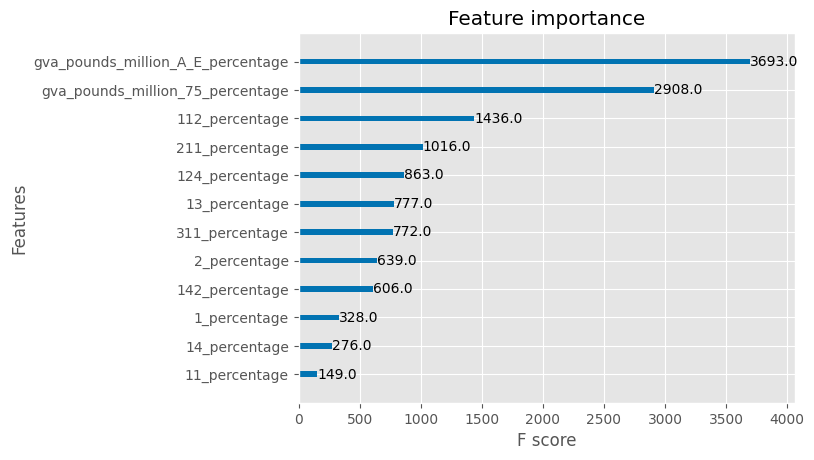

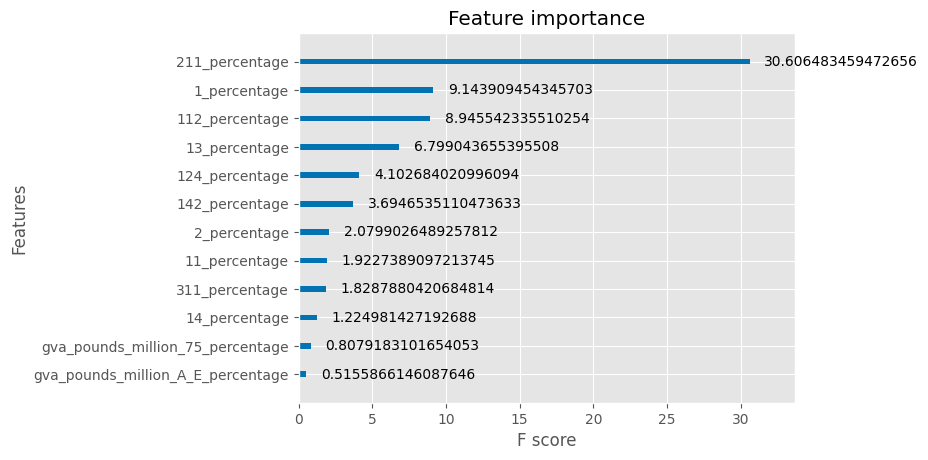

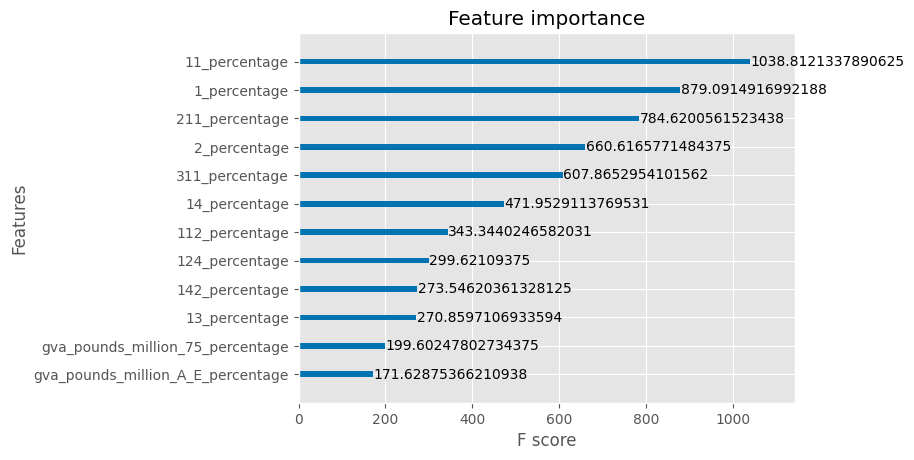

In [7]:
from xgboost import plot_importance

plot_importance(best_regressor,  importance_type='weight')
plt.show()

plot_importance(best_regressor,  importance_type='gain')
plt.show()

plot_importance(best_regressor,  importance_type='cover')
plt.show()


In [8]:
# the number of occurrences of the feature in splits: integers greater than 0 (features not participating in splits are omitted)
# this is the one plotted in the xgboost auto plot
best_regressor.get_booster().get_score(importance_type='weight')

{'111_percentage': 191.0,
 '112_percentage': 138.0,
 '121_percentage': 105.0,
 '122_percentage': 159.0,
 '124_percentage': 120.0,
 '131_percentage': 177.0,
 '132_percentage': 187.0,
 '133_percentage': 165.0,
 '211_percentage': 161.0,
 '213_percentage': 84.0,
 '221_percentage': 181.0,
 '222_percentage': 60.0,
 '223_percentage': 38.0,
 '242_percentage': 146.0,
 '243_percentage': 35.0,
 '311_percentage': 48.0,
 '312_percentage': 67.0,
 '313_percentage': 195.0,
 '323_percentage': 4.0,
 '324_percentage': 209.0,
 '331_percentage': 6.0,
 '411_percentage': 28.0,
 '511_percentage': 158.0,
 '512_percentage': 18.0,
 '11_percentage': 29.0,
 '12_percentage': 39.0,
 '13_percentage': 39.0,
 '21_percentage': 46.0,
 '22_percentage': 10.0,
 '24_percentage': 52.0,
 '31_percentage': 19.0,
 '32_percentage': 177.0,
 '51_percentage': 61.0,
 '1_percentage': 129.0,
 '2_percentage': 228.0,
 '3_percentage': 69.0,
 '5_percentage': 129.0,
 'region_area_percentage': 25.0,
 'ghi_percentage': 560.0,
 'air_temperature

- Feature Importance from Mean Decrease in Impurity (MDI) (training set)
- Permutation Feature Importance (test set)

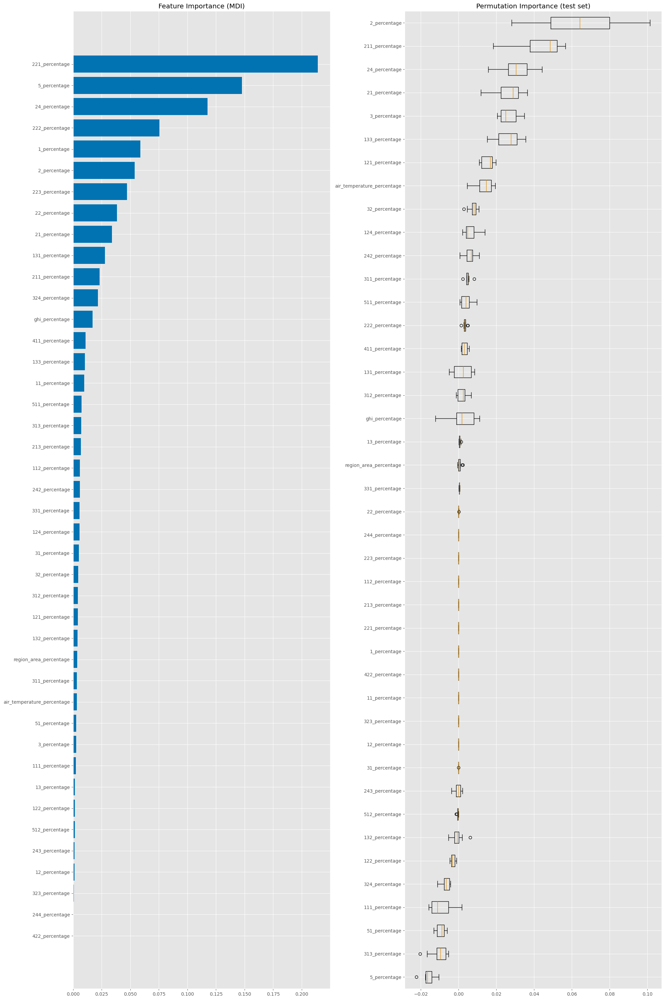

In [9]:
# https://scikit-learn.org/stable/auto_examples/inspection/plot_permutation_importance.html#sphx-glr-auto-examples-inspection-plot-permutation-importance-py
from sklearn.inspection import permutation_importance
feature_importance = best_regressor.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(20, 30))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
plt.yticks(pos, np.array(x_train.columns)[sorted_idx])
plt.title("Feature Importance (MDI)")


# fig = px.bar(x=feature_importance[sorted_idx], y=np.array(X_names1)[sorted_idx], orientation='h')
# fig.update_layout(title='Feature Importance (MDI)', xaxis_title='Importance')
# fig.show()


result = permutation_importance(
    best_regressor, x_test, y_test, n_repeats=10, random_state=42
)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(x_test.columns)[sorted_idx],
)
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()


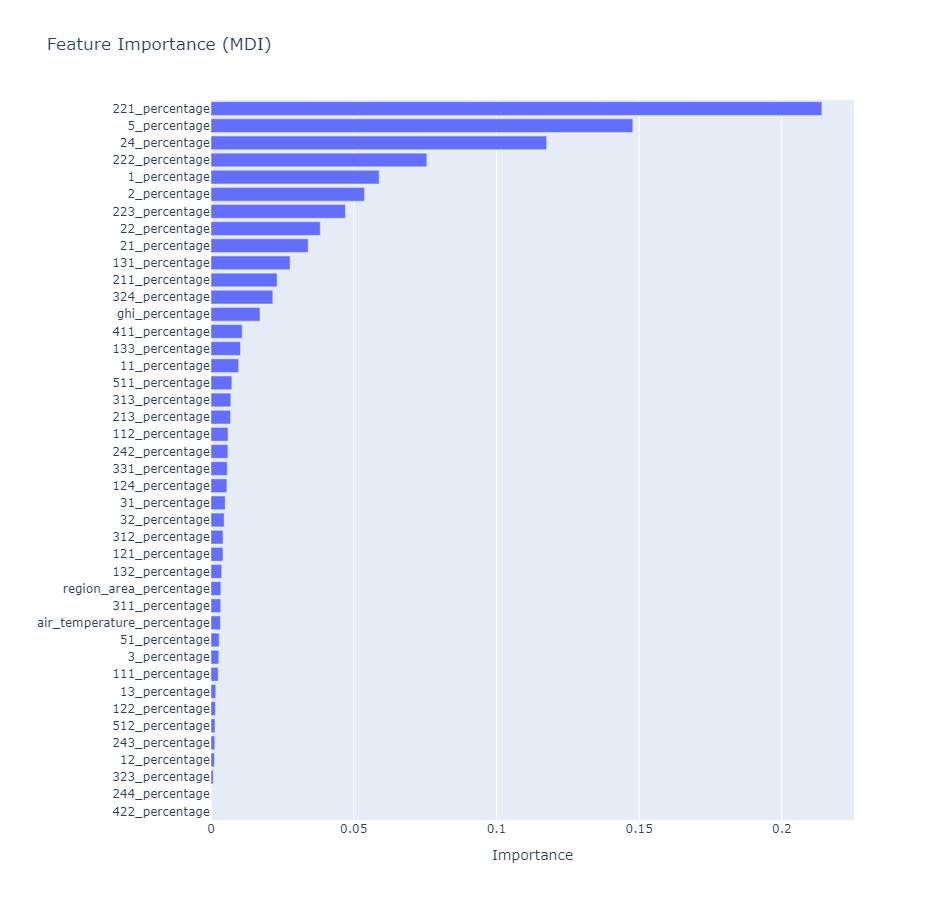

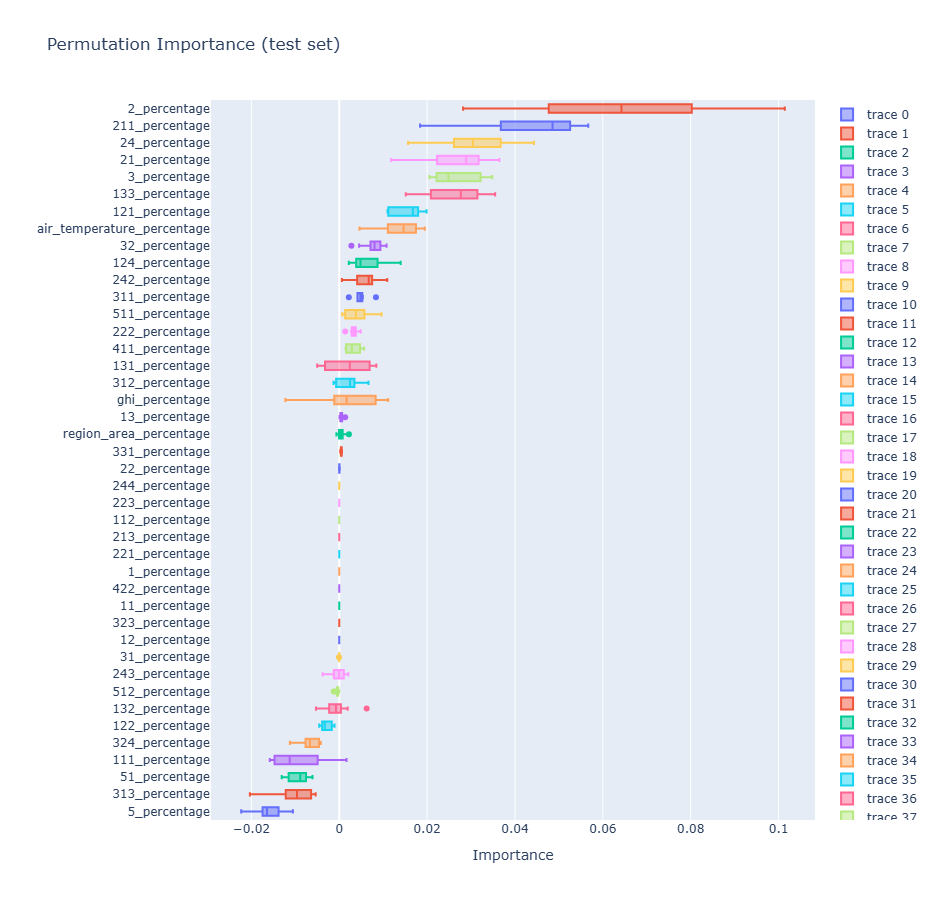

In [10]:
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.inspection import permutation_importance

# Calculate permutation importances
feature_importance = best_regressor.feature_importances_
sorted_idx = np.argsort(feature_importance)

# Create a horizontal bar plot for Feature Importance (MDI)
fig1 = px.bar(
    x=feature_importance[sorted_idx],
    y=np.array(x_test.columns)[sorted_idx],
    orientation='h',
    title='Feature Importance (MDI)',
    labels={'x': 'Importance', 'y': ''}
)

# Increase the figure size for the Feature Importance (MDI) plot
fig1.update_layout(
    width=800,  # Set the width to your desired value
    height=900  # Set the height to your desired value
)

# Create a Permutation Importance plot
result = permutation_importance(
    best_regressor, x_test, y_test, n_repeats=10, random_state=42
)
sorted_idx = result.importances_mean.argsort()

fig2 = go.Figure()

for i in range(len(sorted_idx)):
    feature_name = np.array(x_test.columns)[sorted_idx[i]]
    feature_importances = result.importances[sorted_idx[i]]
    
    fig2.add_trace(
        go.Box(
            y=[feature_name] * len(feature_importances),
            x=feature_importances,
            orientation='h',
            # name=feature_name
        )
    )

fig2.update_layout(
    title='Permutation Importance (test set)',
    xaxis_title='Importance',
    yaxis_title=''
)

# Increase the figure size for the Permutation Importance plot
fig2.update_layout(
    width=800,  # Set the width to your desired value
    height=900  # Set the height to your desired value
)

# Display the plots
fig1.show(config=config)
fig2.show(config=config)


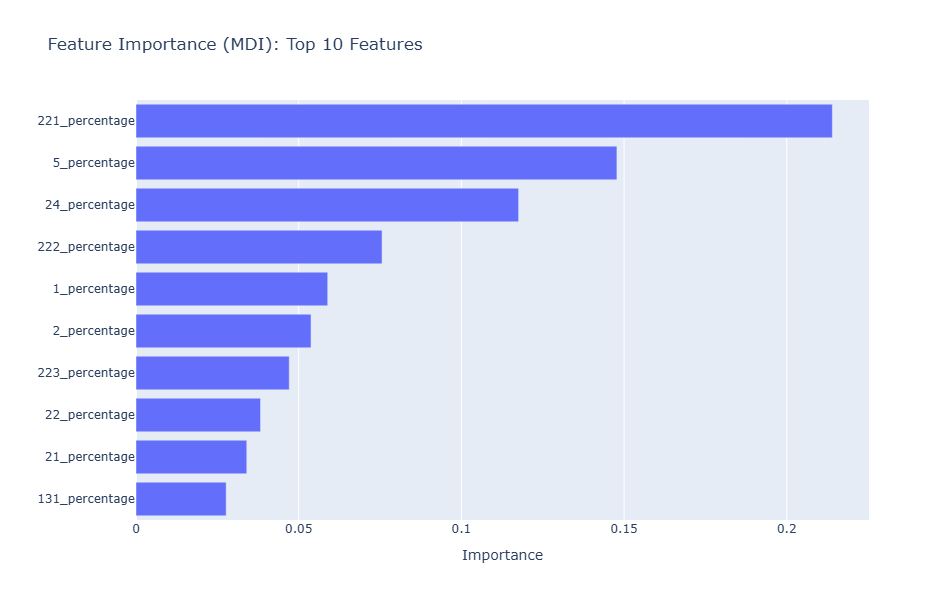

In [11]:
import numpy as np
import plotly.express as px
from sklearn.inspection import permutation_importance

# Calculate permutation importances
feature_importance = best_regressor.feature_importances_
sorted_idx = np.argsort(feature_importance)

# Select the top 10 features
top_n = 10
selected_feature_indices = sorted_idx[-top_n:]
selected_feature_importance = feature_importance[selected_feature_indices]
selected_feature_names = np.array(x_test.columns)[selected_feature_indices]

# Create a horizontal bar plot for Feature Importance (MDI) with the top 10 features
fig1 = px.bar(
    x=selected_feature_importance,
    y=selected_feature_names,
    orientation='h',
    title='Feature Importance (MDI): Top 10 Features',
    labels={'x': 'Importance', 'y': ''}
)

# Increase the figure size for the Feature Importance (MDI) plot
fig1.update_layout(
    width=800,  # Set the width to your desired value
    height=600  # Set the height to your desired value
)

# Display the plot
fig1.show(config=config)


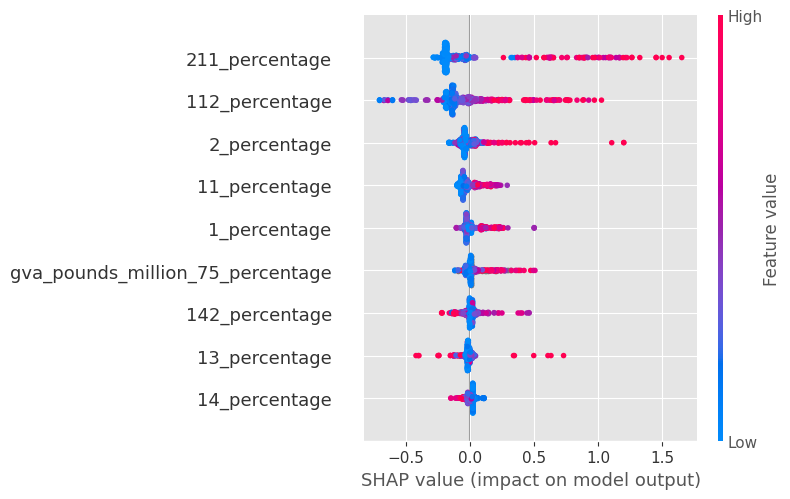

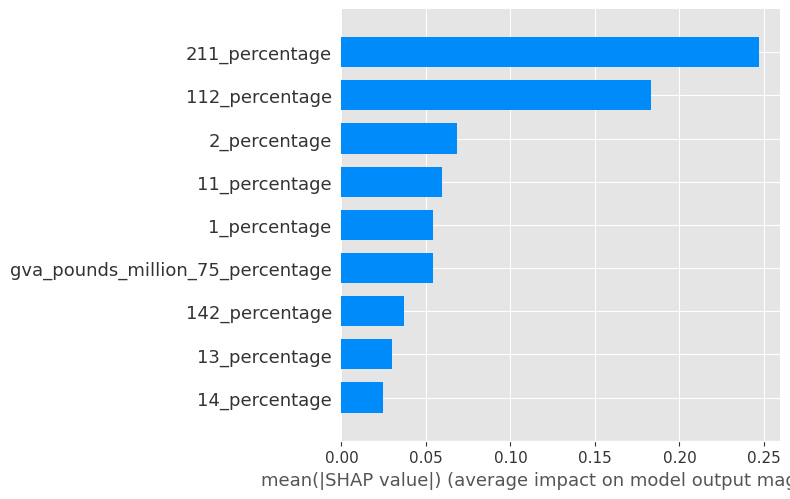

In [7]:
import shap
# https://www.aidancooper.co.uk/a-non-technical-guide-to-interpreting-shap-analyses/

# SHAP values
explainer = shap.TreeExplainer(best_regressor)
# shap_values = explainer.shap_values(x_train)
# shap.summary_plot(shap_values, x_train)
# shap.summary_plot(shap_values, x_train, plot_type="bar")

shap_values = explainer.shap_values(x_test)
shap.summary_plot(shap_values, x_test)
shap.summary_plot(shap_values, x_test, plot_type="bar")


### Number of NUTS regions per country in the data set 

In [13]:
unique_counts = df.groupby('country_cd')['nuts_cd'].nunique()
print(unique_counts)

country_cd
AL     3
AT     9
BE    11
BG     6
CH     7
CY     1
CZ     8
DE    38
DK     5
EE     1
EL    13
ES    19
FI     5
FR    27
HR     4
HU     8
IE     3
IS     1
IT    21
LI     1
LT     2
LU     1
LV     1
ME     1
MK     1
MT     1
NL    12
NO     7
PL    17
PT     7
RO     8
RS     4
SE     8
SI     2
SK     4
TR    26
UK    41
Name: nuts_cd, dtype: int64


/tmp/ipykernel_24220/4073528657.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### Number of NUTS regions per country in the training data set 

In [14]:
# Check the number of nuts regions wihtin the training data. 
unique_counts = training_df.groupby('country_cd')['nuts_cd'].nunique()
print(unique_counts)

country_cd
AL     0
AT     0
BE    11
BG     0
CH     0
CY     0
CZ     0
DE    38
DK     0
EE     0
EL     0
ES    15
FI     0
FR    26
HR     0
HU     0
IE     0
IS     0
IT    19
LI     0
LT     0
LU     0
LV     0
ME     0
MK     0
MT     0
NL     0
NO     0
PL     0
PT     0
RO     0
RS     0
SE     0
SI     0
SK     0
TR     0
UK    41
Name: nuts_cd, dtype: int64


/tmp/ipykernel_24220/1111970331.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [8]:
# Number of data points available in each year
counts = training_df['year'].value_counts()
print(counts)

year
2010    168
2011    168
2012    168
2013    168
2014    168
2015    168
2016    168
2017    168
2018    168
2019    168
2020    168
2021    168
2022    168
2023    168
Name: count, dtype: int64


In [9]:
# number of data points available in each country 
country_counts = training_df['country_cd'].value_counts()
print(country_counts)

country_cd
UK    2352
Name: count, dtype: int64


## Results

### The error metrics for predicting the regional capacity percentage 

In [10]:
training_results(y_train, y_test, y_test_pred, y_train_pred, log_to_mlflow=False)

R2 training score is  0.9133968911495015
R2 test score is  0.8559268969472705
The MSE is: 0.10112941554867436
The MAE is: 0.21968030604079894
RMSE is: 0.31800851489963966
MAPE is: 140143966377302.14


### Plotting actual vs predicted

#### Actual vs predicted regional capacity for training set

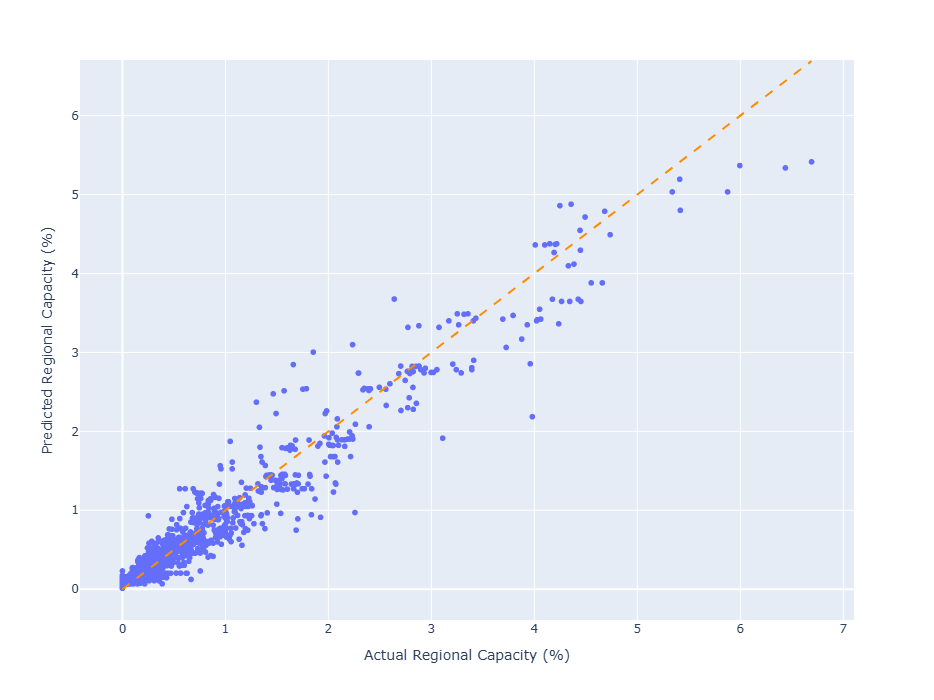

In [8]:
plot_set(regional_data, 'train', capacity_unit='percentage')

#### Actual vs predicted regional capacity for test set

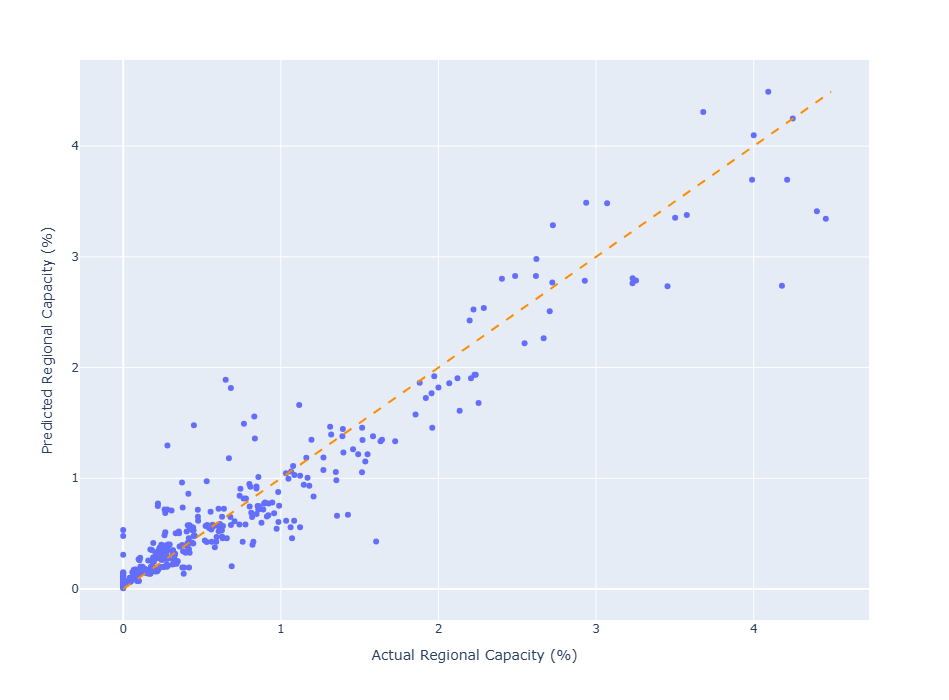

In [9]:
plot_set(regional_data, 'test', capacity_unit='percentage')

### Scaling regional capacity so it adds to the national capacity 

In [13]:
training_scaled_results(gb_data, log_to_mlflow=False)

R2 test score is  0.8962500190538383
The MSE is: 0.07585833625912262
The MAE is: 0.17775485410534925
RMSE is: 0.27542392100019675
MAPE is: 104588966819659.4
R2 test score is  0.8481694318418198
The MSE is: 0.10657462284712713
The MAE is: 0.21629042457600947
RMSE is: 0.32645768921427953
MAPE is: 133347351349541.33


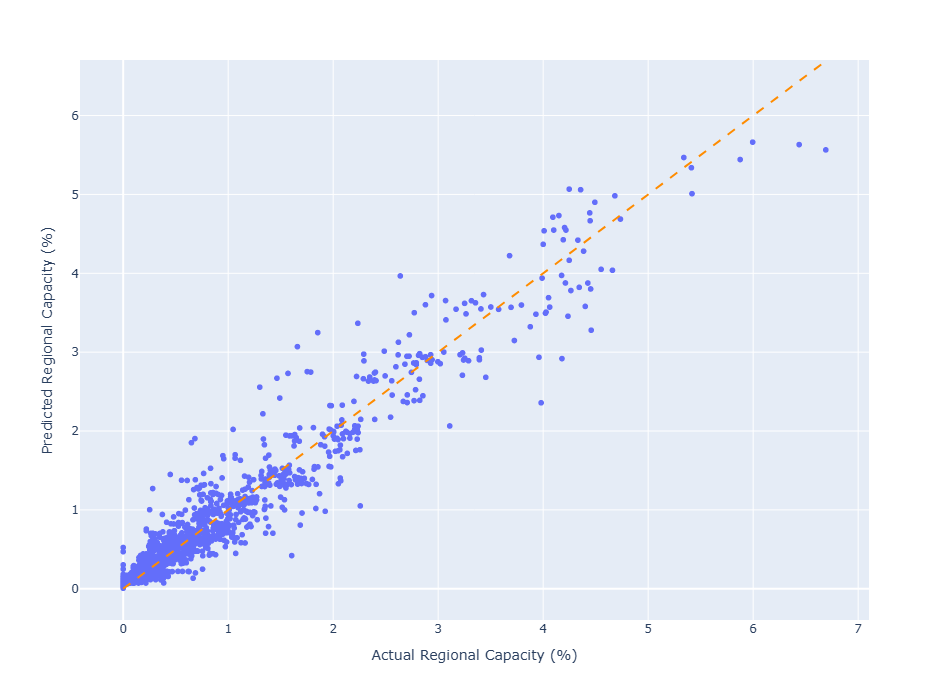

In [10]:
plot_actual_vs_predicted_regional_capacity(gb_data, capacity_unit='percentage', scaled=True)

### Residual Analysis

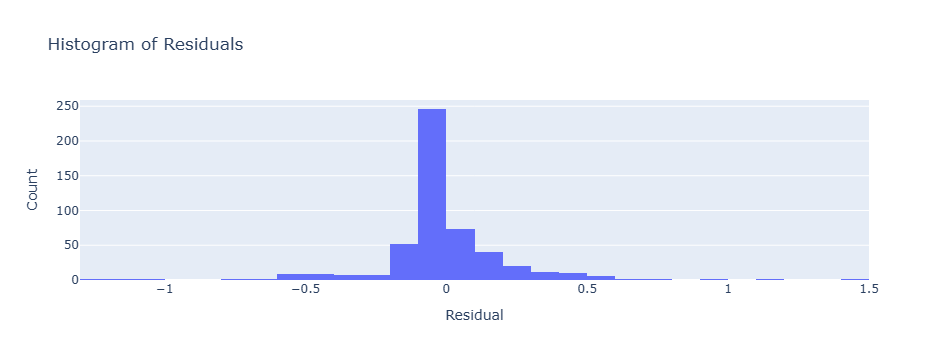

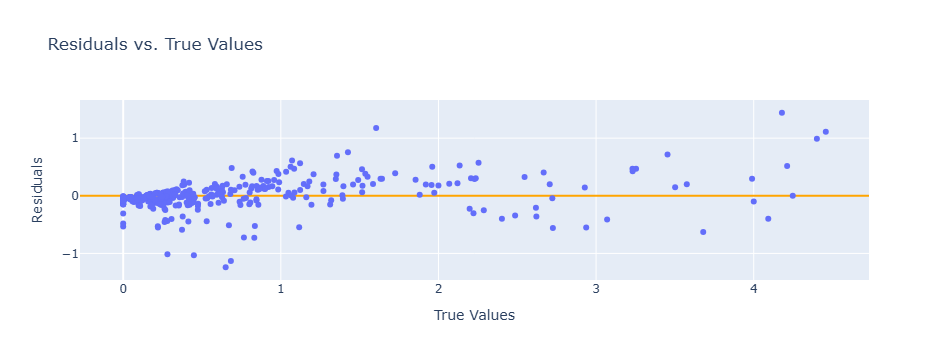

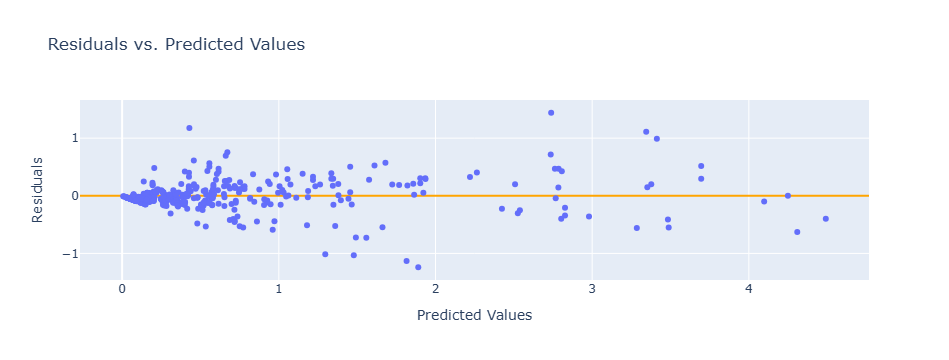

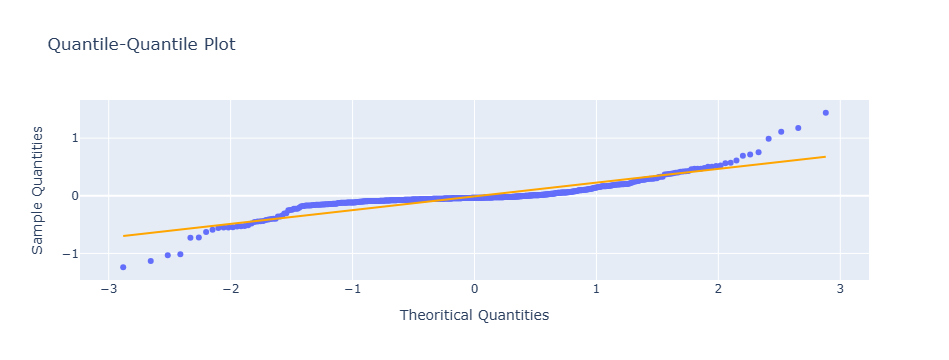

In [11]:
import plotly.graph_objs as go
from statsmodels.graphics.gofplots import qqplot
from chart_studio.plotly import plot, iplot
import plotly.offline as pyo
# pyo.init_notebook_mode(connected=True)
# pyo.init_notebook_mode()

import chart_studio.plotly as py

# Calculate residuals
residuals = y_test - y_test_pred


# Plot histogram of residuals
hist_trace = go.Histogram(x=residuals, nbinsx=50, marker_color='#636efa')
layout = go.Layout(title='Histogram of Residuals',
                   xaxis_title='Residual',
                   yaxis_title='Count')
fig = go.Figure(data=hist_trace, layout=layout)
fig.show(config=config)

# Plot residuals against y_test
scatter_trace = go.Scatter(x=y_test, y=residuals, mode='markers', marker_color='#636efa')
layout = go.Layout(title='Residuals vs. True Values',
                   xaxis_title='True Values',
                   yaxis_title='Residuals')
layout.yaxis.zeroline = True
layout.yaxis.zerolinecolor = 'orange'
layout.yaxis.zerolinewidth = 2
# layout.yaxis.zerolinetype = 'dashed'
fig = go.Figure(data=scatter_trace, layout=layout)
fig.show(config=config)

# Plot residuals against y_pred
scatter_trace = go.Scatter(x=y_test_pred, y=residuals, mode='markers', marker_color='#636efa')
layout = go.Layout(title='Residuals vs. Predicted Values',
                   xaxis_title='Predicted Values',
                   yaxis_title='Residuals')
layout.yaxis.zeroline = True
layout.yaxis.zerolinecolor = 'orange'
layout.yaxis.zerolinewidth = 2
# layout.yaxis.zerolinetype = 'dashed'
fig = go.Figure(data=scatter_trace, layout=layout)
fig.show(config=config)



qqplot_data = qqplot(residuals, line='s').gca().lines
plt.close()

fig = go.Figure()

fig.add_trace({
    'type': 'scatter',
    'x': qqplot_data[0].get_xdata(),
    'y': qqplot_data[0].get_ydata(),
    'mode': 'markers',
    'marker': {
        # 'color': '#19d3f3'
    }
})

fig.add_trace({
    'type': 'scatter',
    'x': qqplot_data[1].get_xdata(),
    'y': qqplot_data[1].get_ydata(),
    'mode': 'lines',
    'line': {
        'color': 'orange'
    }

})


fig['layout'].update({
    'title': 'Quantile-Quantile Plot',
    'xaxis': {
        'title': 'Theoritical Quantities',
        'zeroline': False
    },
    'yaxis': {
        'title': 'Sample Quantities'
    },
    'showlegend': False,
    # 'width': 800,
    # 'height': 700,
})

pyo.iplot(fig, config=config)
# iplot(fig, filename='normality-QQ')
# py.iplot(fig, filename='normality-QQ')

### Applying the model to EU countries

- Apply the model to estimate the regional capacity which is a percentage of the national capacity
- Multiply the capacity percentage by the national capacity to get the reigonal capacity in MW
- Sum the estimated capacity for all the regions in a country and compare to the national capacity
- Scale the regional capacity so the sum of the capacity for all the regions equals the national capacity

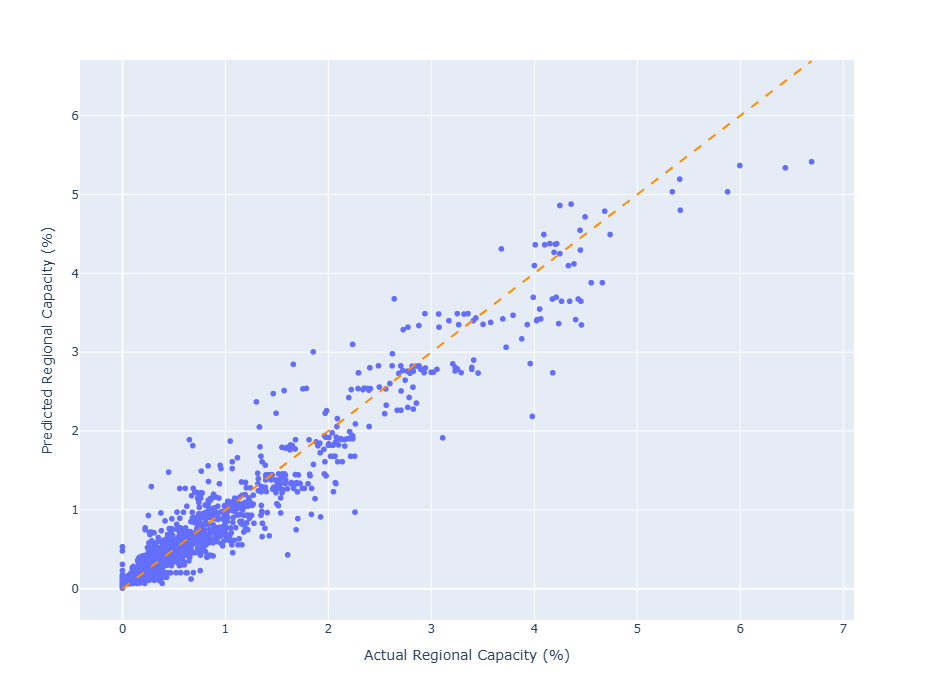

In [12]:
plot_actual_vs_predicted_regional_capacity(gb_data, capacity_unit='percentage', scaled=False)

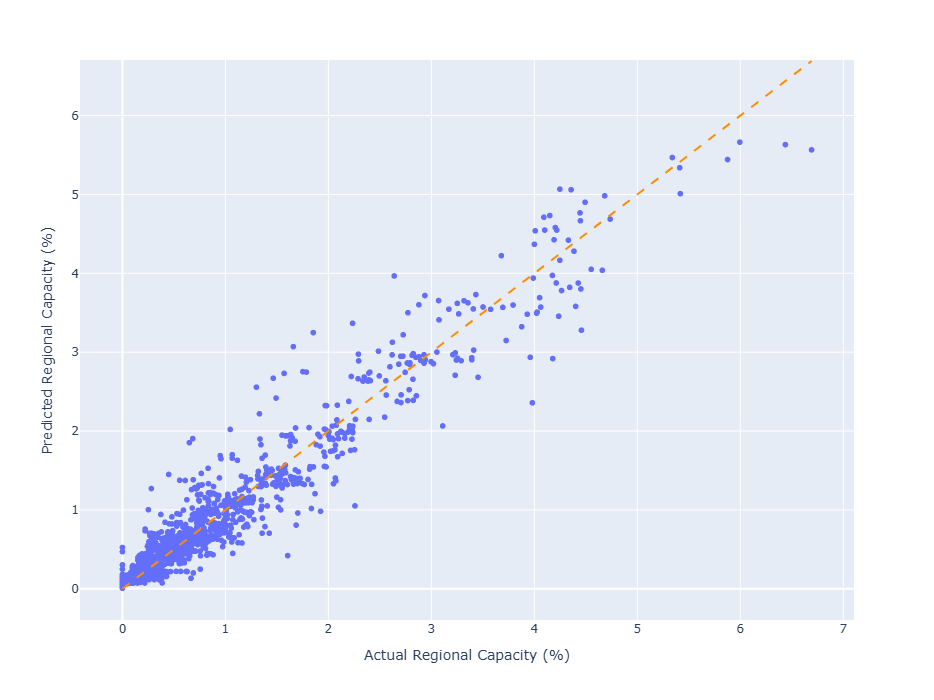

In [13]:
plot_actual_vs_predicted_regional_capacity(gb_data, capacity_unit='percentage', scaled=True)

### Actual vs predicted national capacity before scaling

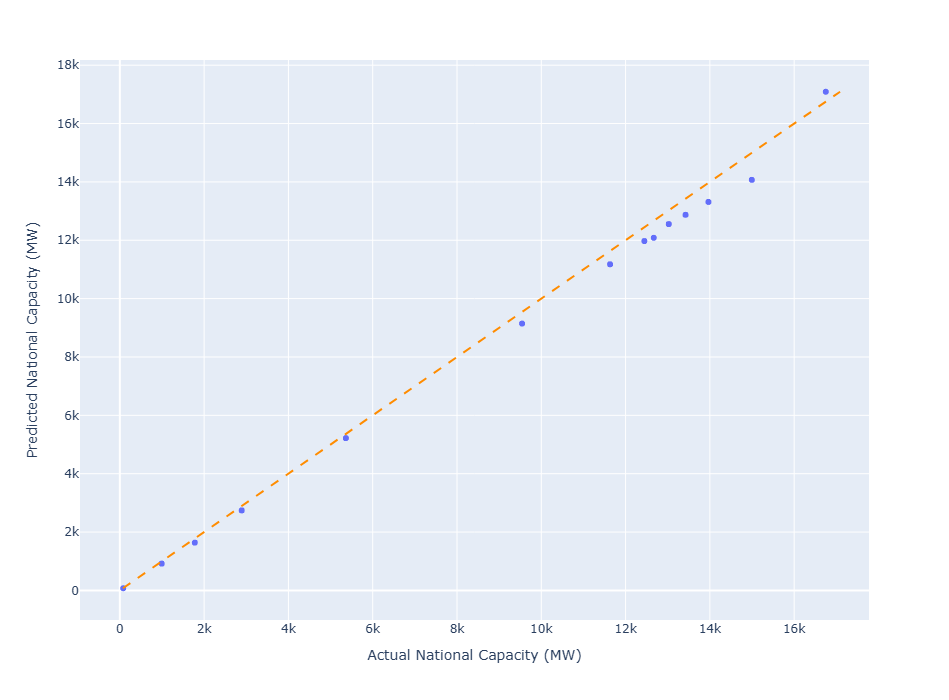

In [14]:
plot_actual_vs_predicted_national_capacity(gb_data, by_factor=False, scaled=False)


### Actual vs predicted national capacity after scaling

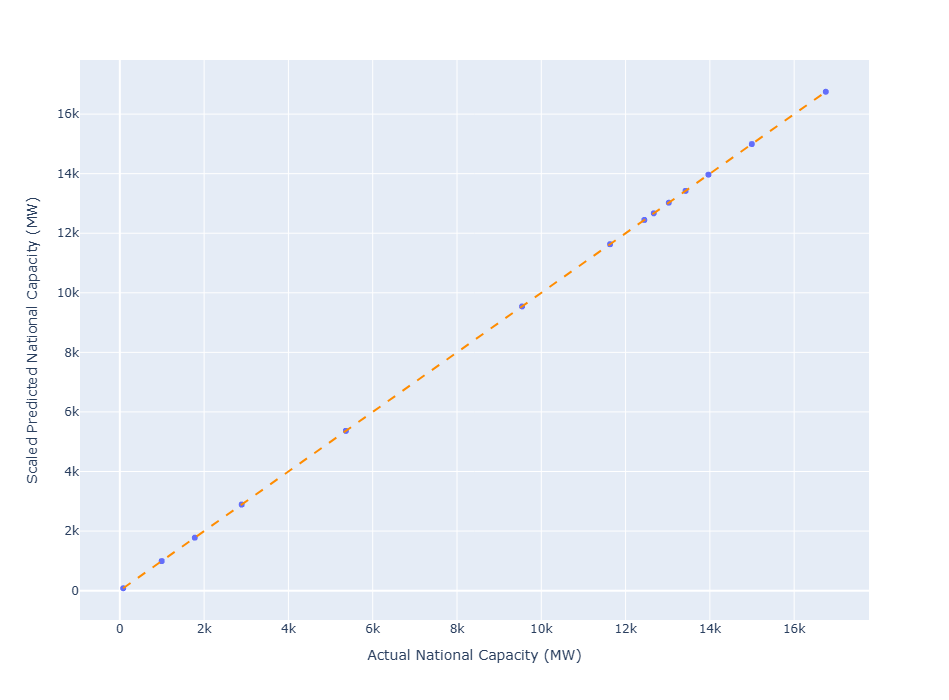

In [15]:
plot_actual_vs_predicted_national_capacity(gb_data, by_factor=False, scaled=True)


In [16]:
mape_by_year_country, mape_by_country = calculate_mape_by_country(gb_data, 'country', 'national_capacity_mwp', 'predicted_national_capacity_mwp')
mape_by_year_country
mape_by_country

/gb_pv_capacity_model/models/model_training_norm.py:801: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/gb_pv_capacity_model/models/model_training_norm.py:807: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,country,Average_MAPE
0,United Kingdom,4.8


### Residual by country

In [24]:

# fig = px.box(eu_data, x="Country", y="National Residual (MW)", title="National Residual per Country")
# fig.update_layout(xaxis_title='Country', yaxis_title='National Residual (MW)', autosize=False, width=1000, height=700)
# # fig.update_layout(autosize=False, width=700, height=700)
# fig.show(config=config)

# fig = px.box(eu_data, x="Country", y="National Residual (%)", title="National Residual per Country")
# fig.update_layout(xaxis_title='Country', yaxis_title='National Residual (%)', autosize=False, width=1000, height=700)
# # fig.update_layout(autosize=False, width=700, height=700)
# fig.show(config=config)

# fig = px.box(eu_data, x="Country", y="Scaled National Residual (MW)", title="Scaled National Residual per Country")
# fig.update_layout(xaxis_title='Country', yaxis_title='Scaled National Residual (MW)', autosize=False, width=1000, height=700)
# # fig.update_layout(autosize=False, width=700, height=700)
# fig.show(config=config)


# # fig = px.box(eu_data, x="Country", y="MAPE (%)", title="MAPE per Country")
# # fig.update_layout(xaxis_title='Country', yaxis_title='MAPE (%)', autosize=False, width=1000, height=700)
# # # fig.update_layout(autosize=False, width=700, height=700)
# # fig.show(config=config)

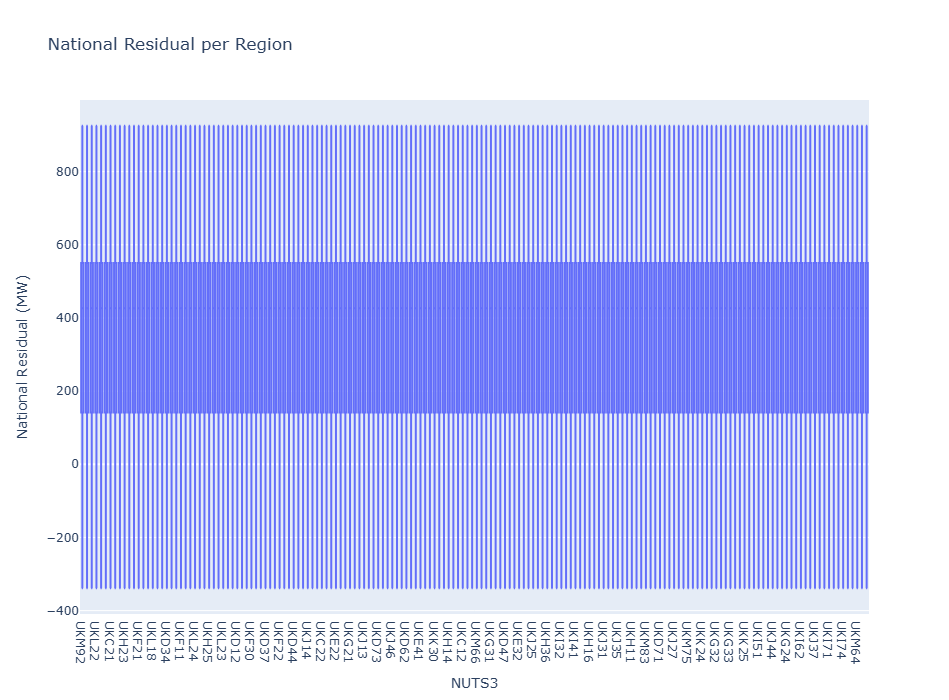

In [17]:

fig1 = px.box(gb_data, x="nuts_cd", y="national_residual_mwp", title="National Residual per Region")
fig1.update_layout(xaxis_title='NUTS3', yaxis_title='National Residual (MW)', autosize=False, width=1000, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig1.show(config=config)




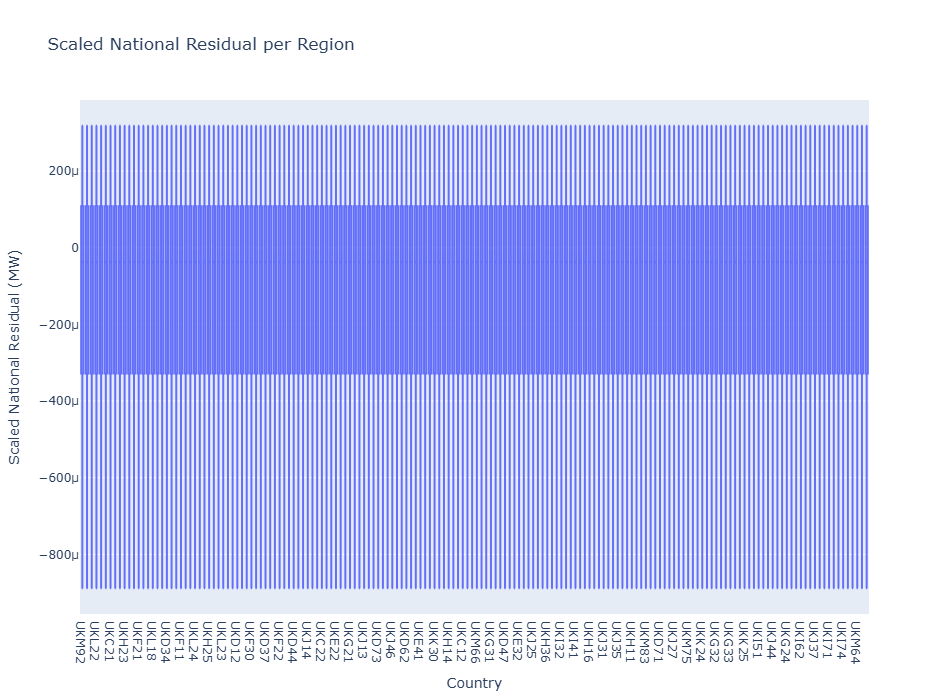

In [18]:
fig3 = px.box(gb_data, x="nuts_cd", y="scaled_national_residual_mwp", title="Scaled National Residual per Region")
fig3.update_layout(xaxis_title='Country', yaxis_title='Scaled National Residual (MW)', autosize=False, width=1000, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig3.show(config=config)

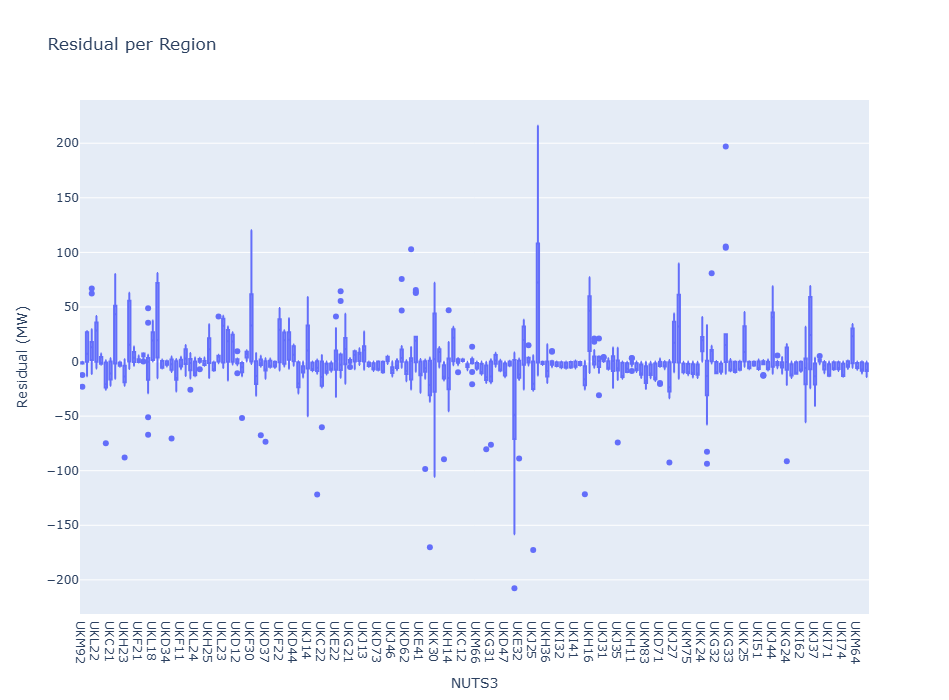

In [19]:
fig2 = px.box(gb_data, x="nuts_cd", y="residual_mwp", title="Residual per Region")
fig2.update_layout(xaxis_title='NUTS3', yaxis_title='Residual (MW)', autosize=False, width=1000, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig2.show(config=config)

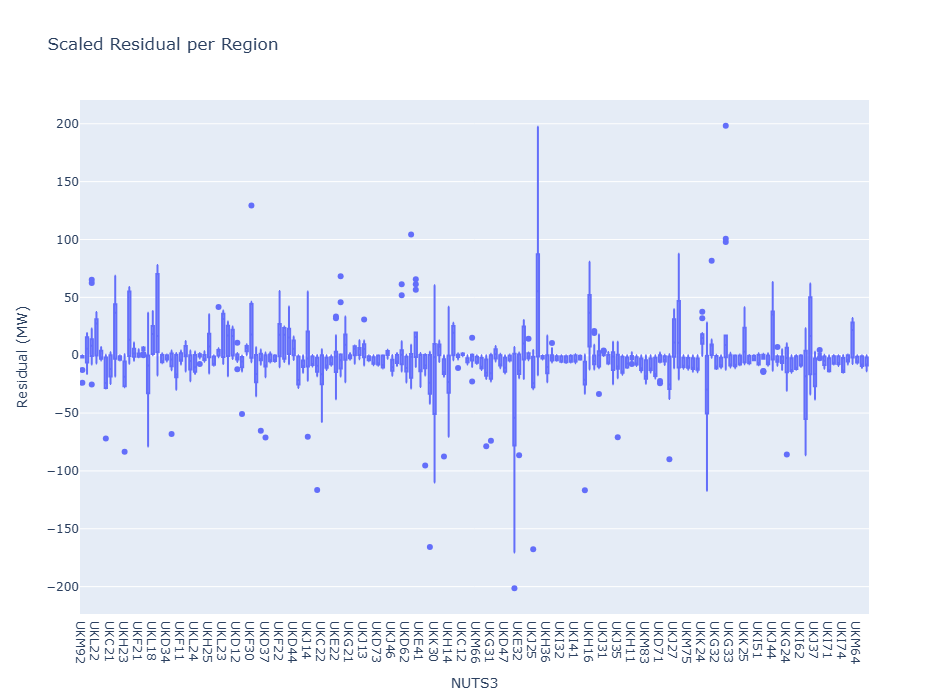

In [20]:
fig4 = px.box(gb_data, x="nuts_cd", y="scaled_residual_mwp", title="Scaled Residual per Region")
fig4.update_layout(xaxis_title='NUTS3', yaxis_title='Residual (MW)', autosize=False, width=1000, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig4.show(config=config)

### Residual by year

In [30]:
# fig = px.box(eu_data, x="year", y="National Residual (MW)",title="National Residual per Year",  hover_data=["National Residual (MW)", "Country"])
# fig.update_layout(xaxis_title='Year', yaxis_title='National Residual (MW)', autosize=False, width=900, height=700)
# # fig.update_layout(autosize=False, width=700, height=700)
# fig.show(config=config)

# fig = px.box(eu_data, x="year", y="National Residual (%)",title="National Residual per Year",  hover_data=["National Residual (%)", "Country"])
# fig.update_layout(xaxis_title='Year', yaxis_title='National Residual (%)', autosize=False, width=900, height=700)
# # fig.update_layout(autosize=False, width=700, height=700)
# fig.show(config=config)

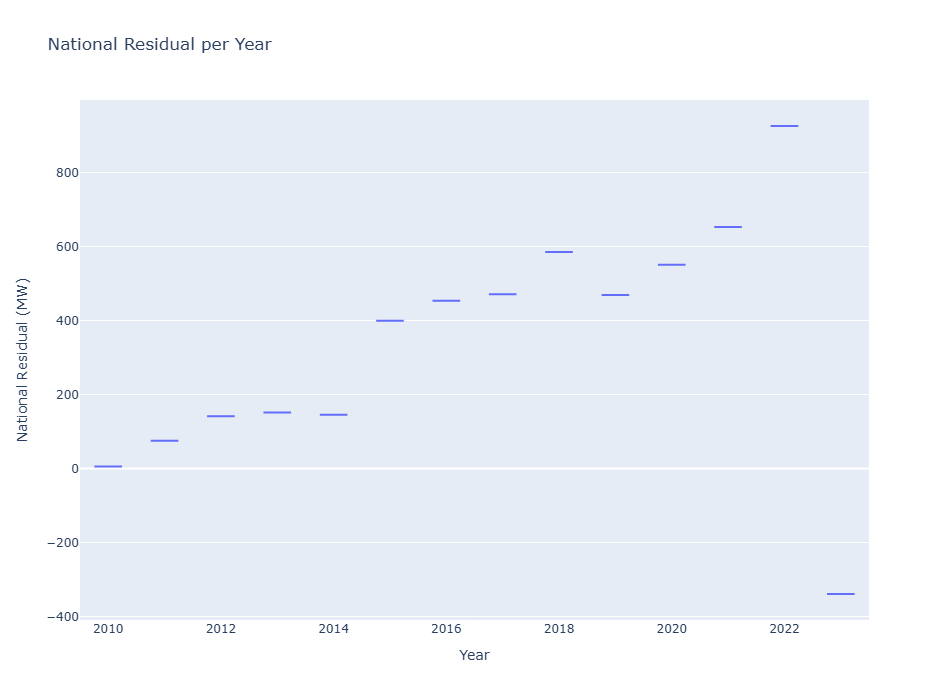

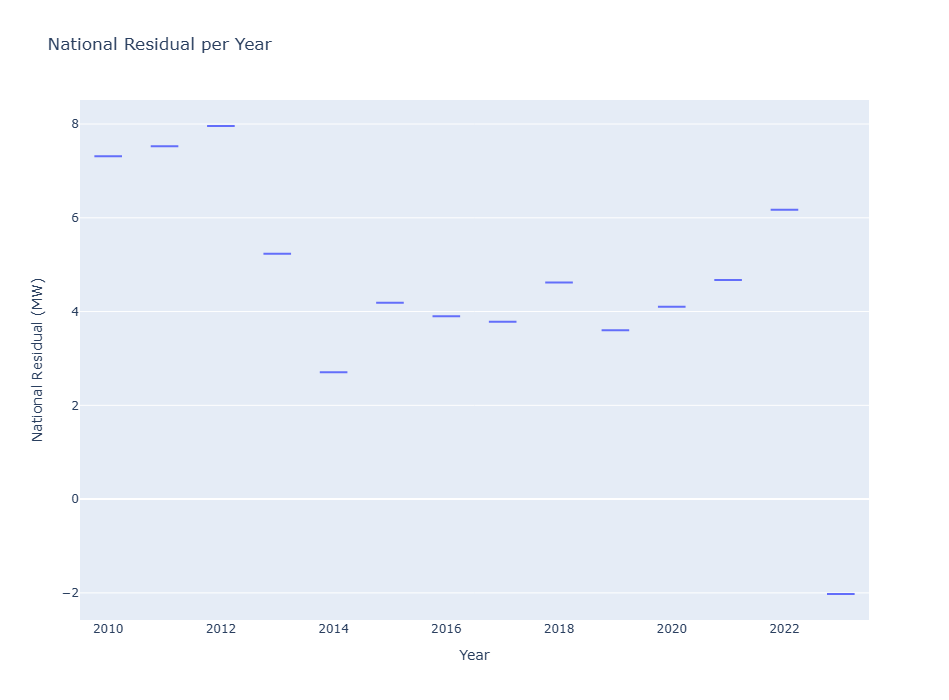

In [21]:
fig = px.box(gb_data, x="year", y="national_residual_mwp",title="National Residual per Year",  hover_data=["national_residual_mwp", "country"])
fig.update_layout(xaxis_title='Year', yaxis_title='National Residual (MW)', autosize=False, width=900, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig.show(config=config)

fig = px.box(gb_data, x="year", y="national_residual_percentage",title="National Residual per Year",  hover_data=["national_residual_percentage", "country"])
fig.update_layout(xaxis_title='Year', yaxis_title='National Residual (MW)', autosize=False, width=900, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig.show(config=config)



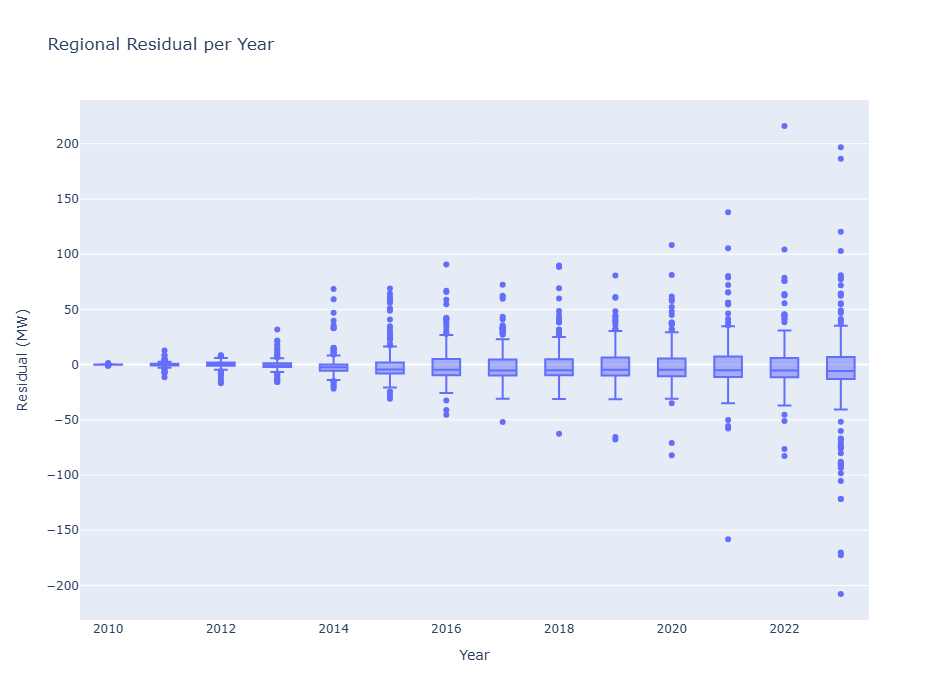

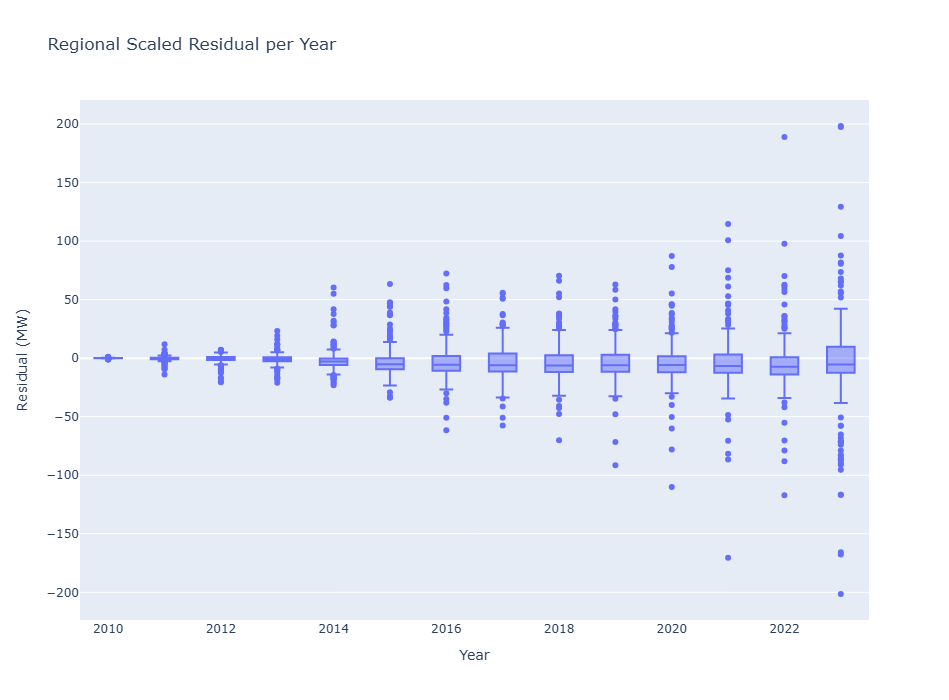

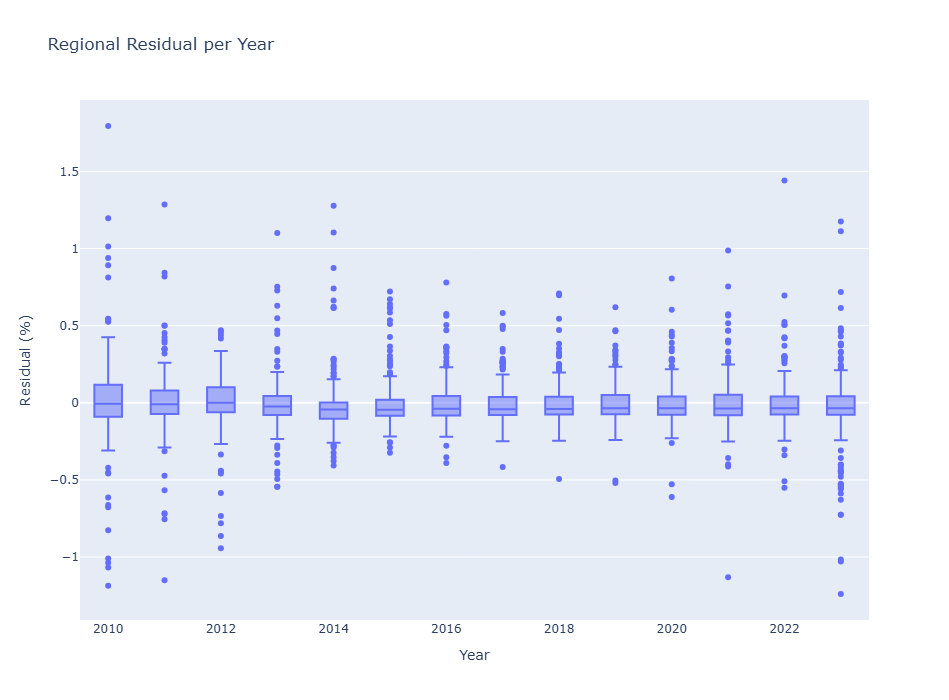

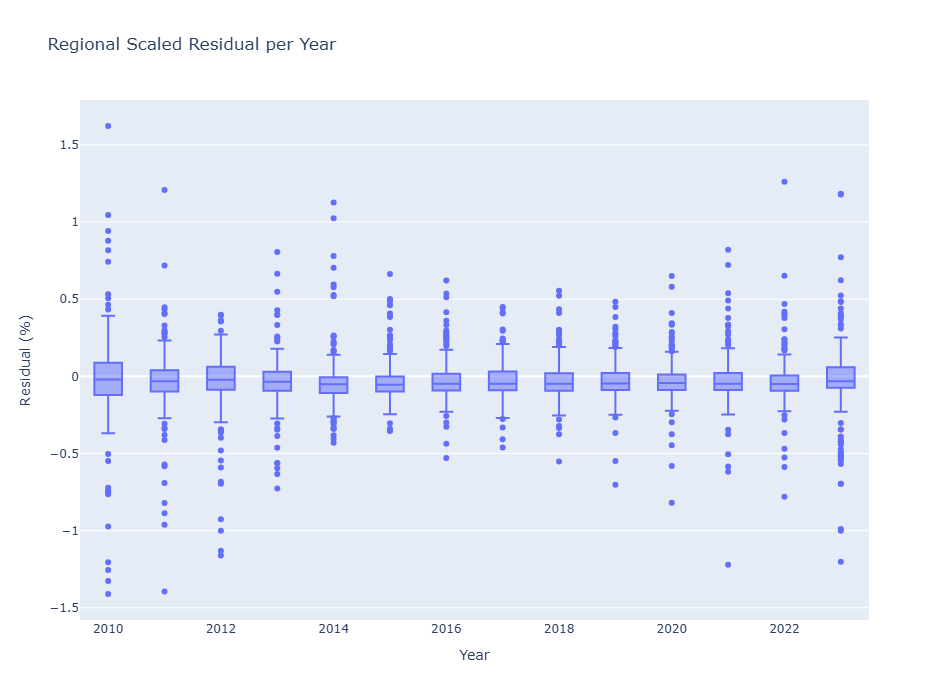

In [22]:
fig = px.box(gb_data, x="year", y="residual_mwp",title="Regional Residual per Year",  hover_data=["residual_mwp", "country"])
fig.update_layout(xaxis_title='Year', yaxis_title='Residual (MW)', autosize=False, width=900, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig.show(config=config)

fig = px.box(gb_data, x="year", y="scaled_residual_mwp",title="Regional Scaled Residual per Year",  hover_data=["scaled_residual_mwp", "country"])
fig.update_layout(xaxis_title='Year', yaxis_title='Residual (MW)', autosize=False, width=900, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig.show(config=config)

fig = px.box(gb_data, x="year", y="residual_percentage",title="Regional Residual per Year",  hover_data=["residual_percentage", "nuts_cd"])
fig.update_layout(xaxis_title='Year', yaxis_title='Residual (%)', autosize=False, width=900, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig.show(config=config)

fig = px.box(gb_data, x="year", y="scaled_residual_percentage",title="Regional Scaled Residual per Year",  hover_data=["scaled_residual_percentage", "nuts_cd"])
fig.update_layout(xaxis_title='Year', yaxis_title='Residual (%)', autosize=False, width=900, height=700)
# fig.update_layout(autosize=False, width=700, height=700)
fig.show(config=config)


### Results: error metrics (national)

Before scaling

In [23]:
gb_results(gb_data)

R2 test score is  0.9932784137695417
The MSE is: 208578.49821842057
The MAE is: 383.20075785493924
RMSE is: 456.70395029868155
MAPE is: 0.04842425595415989


After scaling

In [24]:
gb_scaled_results(gb_data)

R2 test score is  0.9999999999999963
The MSE is: 1.1419747964473155e-07
The MAE is: 0.0002477120534284235
RMSE is: 0.0003379311758993709
MAPE is: 3.1430058036660145e-08
